Student Name:Rojan Shrestha

Student ID:2408474

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd "/content/drive/MyDrive/Colab Notebooks/final"

/content/drive/MyDrive/Colab Notebooks/final


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report


In [5]:
!ls

 Alzheimer_cleaned_dataset.csv	     'House Price Prediction Dataset.csv'
 alzheimers_disease_data.csv	     'Kenya Malaria_Prediction Dataset by who.csv'
 ClassificationFInalest.ipynb	      Malria_cleaned_dataset.csv
 cleantedWaterQuality_dataset.csv     ParisHousing.csv
'Copy of Housing Price Dataset.csv'   RegressionFinalest.ipynb
'Copy of regression.ipynb'	      RegressionFinal.ipynb
 datacleanedparis.csv		      waterQuality1.csv


The "Alzheimer's Disease Dataset" was created by Rabie El Kharoua and is available on Kaggle. The specific creation date isn't provided in the available information.

This dataset aligns with the United Nations Sustainable Development Goal (UNSDG) 3:

 Good Health and Well-being, as it can be utilized to develop predictive models for Alzheimer's disease, thereby aiding in its early detection and management.

The dataset contains the following attributes (columns):

Subject ID: Unique identifier for each subject.

MRI ID: Unique identifier for each MRI scan.

Group: Diagnosis group (e.g., Control, Alzheimer's Disease).

Visit: Visit number.

MR Delay: Time (in days) between baseline and scan date.


M/F: Gender of the subject.


Hand: Dominant hand of the subject
.
Age: Age of the subject at the time of the scan.

EDUC: Years of education.

SES: Socioeconomic status.

MMSE: Mini-Mental State Examination score.

CDR: Clinical Dementia Rating.

eTIV: Estimated total intracranial volume.

nWBV: Normalized whole-brain volume.

ASF: Atlas scaling factor.


In [6]:
df = pd.read_csv('alzheimers_disease_data.csv')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

In [8]:
shape=df.shape
print("The shape of dataset:",shape)

The shape of dataset: (2149, 35)


In [9]:
print("Missing Values:")
df.isnull().sum().sum()

Missing Values:


0

In [10]:
print("Dataset:")
df.head()

Dataset:


,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid


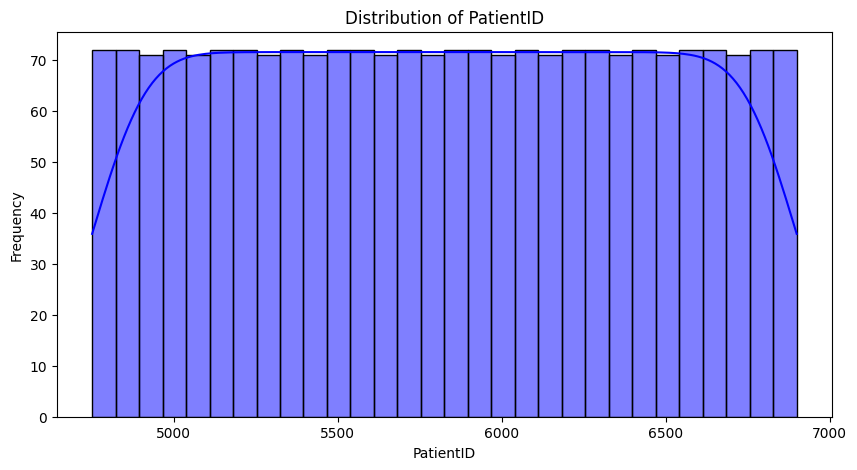

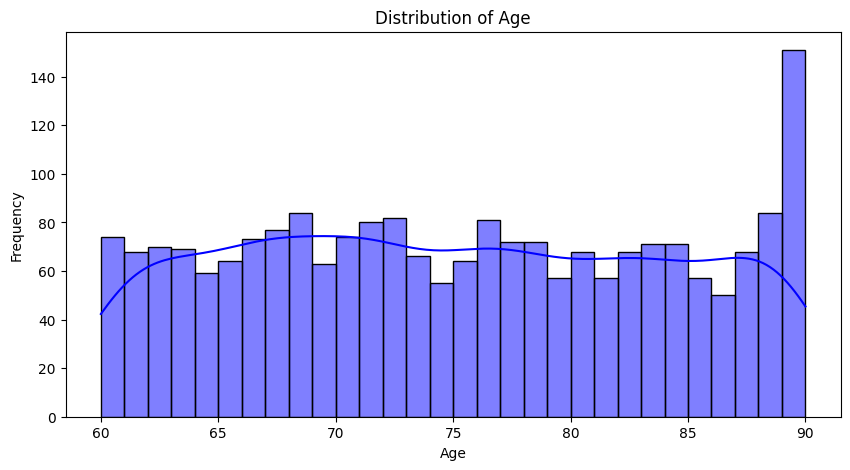

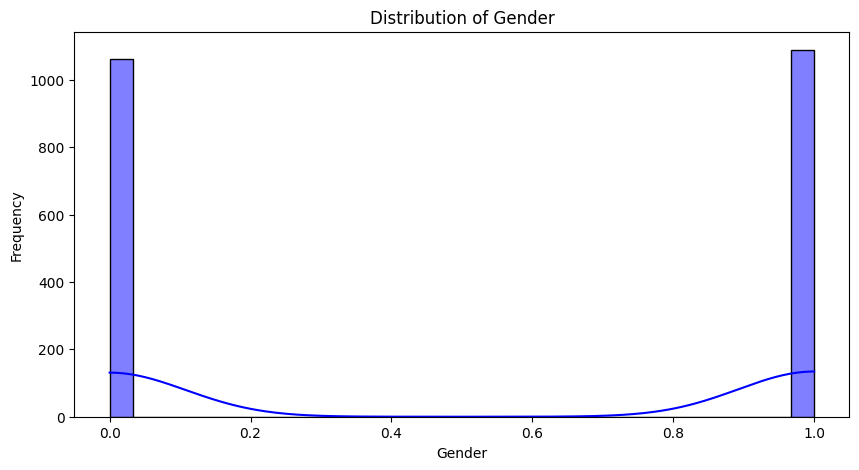

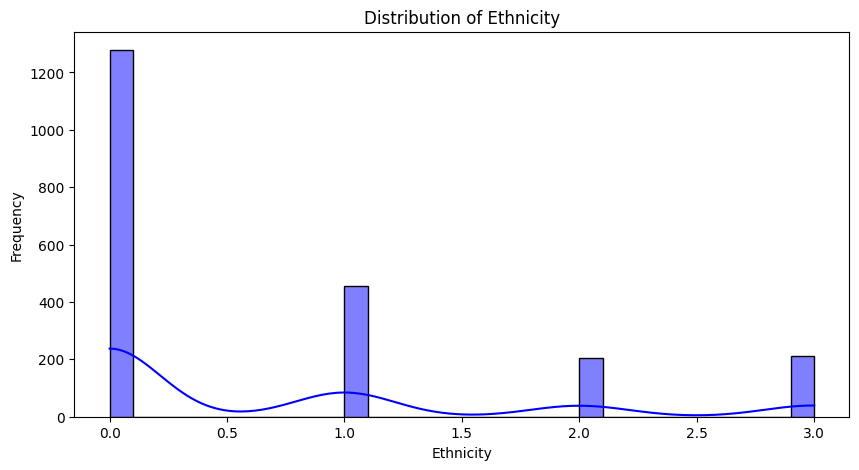

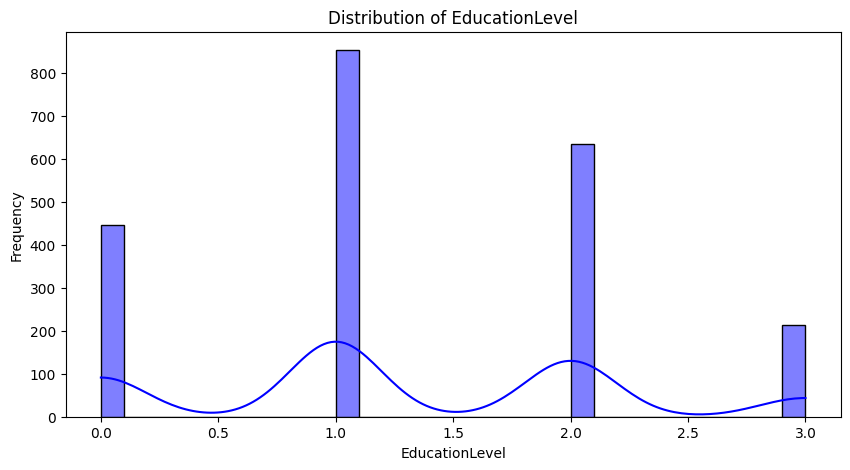

...

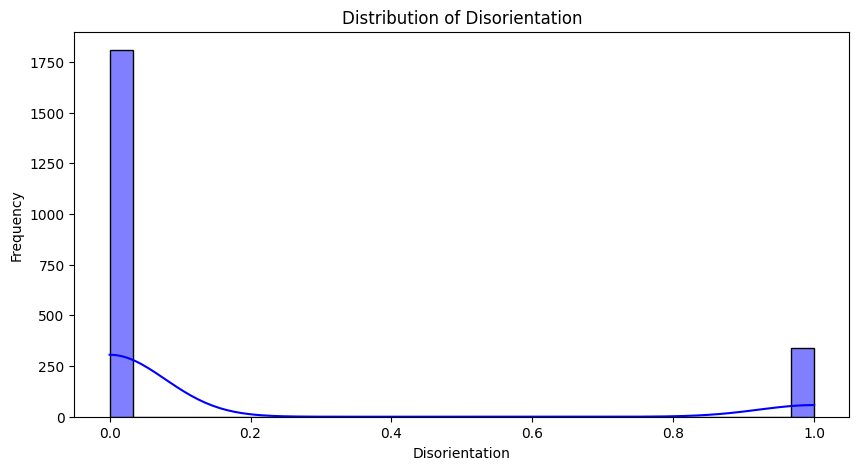

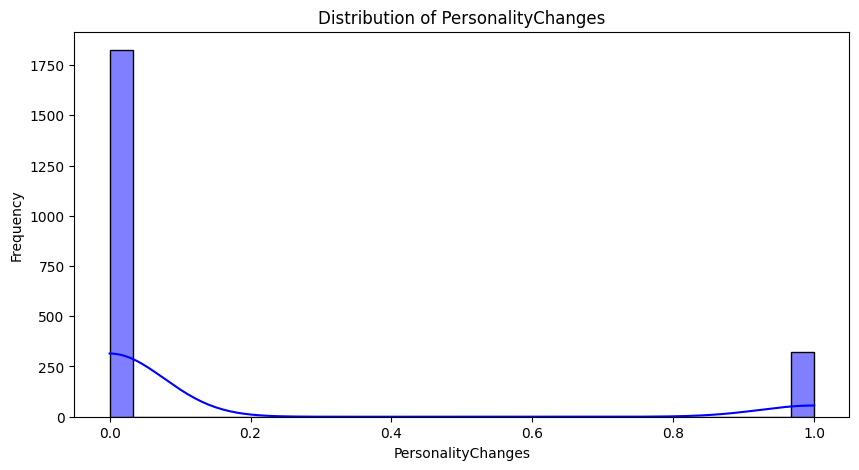

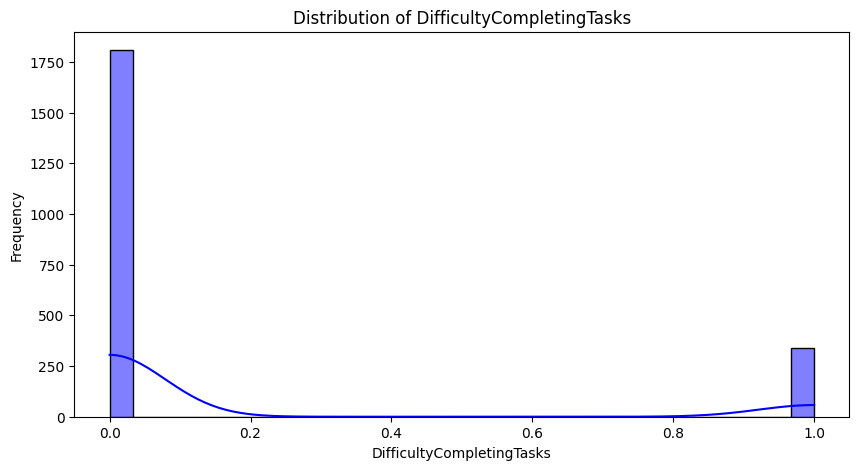

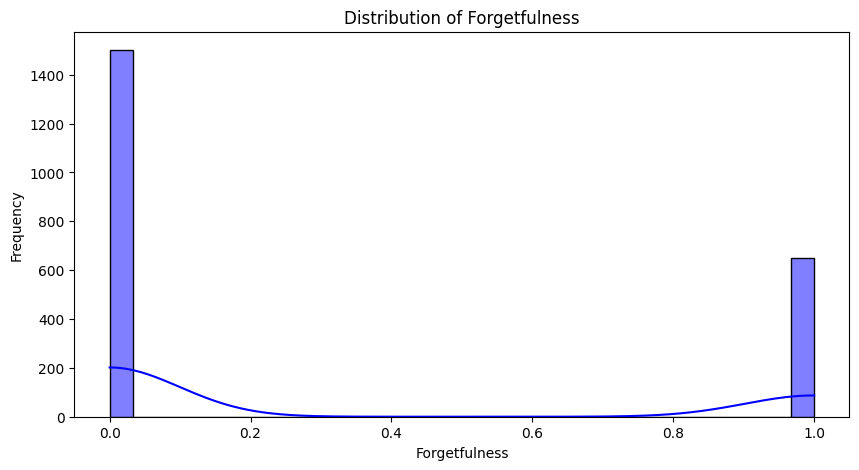

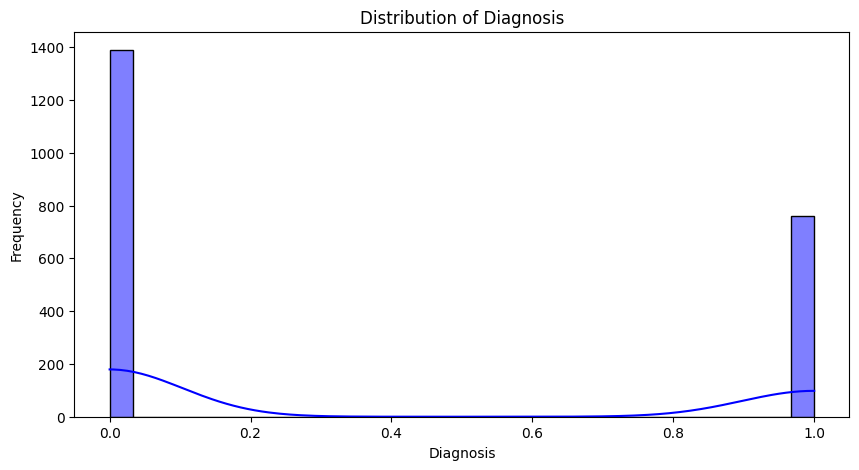

In [11]:
for col in df.select_dtypes(include=["int64", "float64"]).columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(df[col], kde=True, bins=30, color='blue')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

ONehotencoder

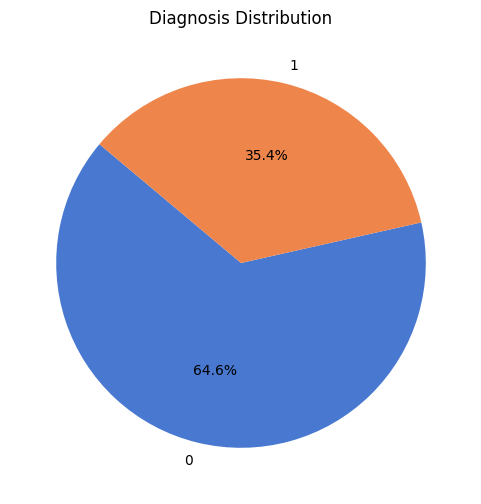

In [12]:
categories = [0, 1]
counts = df.Diagnosis.value_counts().tolist()

# Choose a color palette from Seaborn for the pie chart
colors = sns.color_palette("muted")

# Plot the pie chart with the counts of each response category
plt.figure(figsize=(6, 6))
plt.pie(counts, labels=categories, autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Diagnosis Distribution')
plt.show()

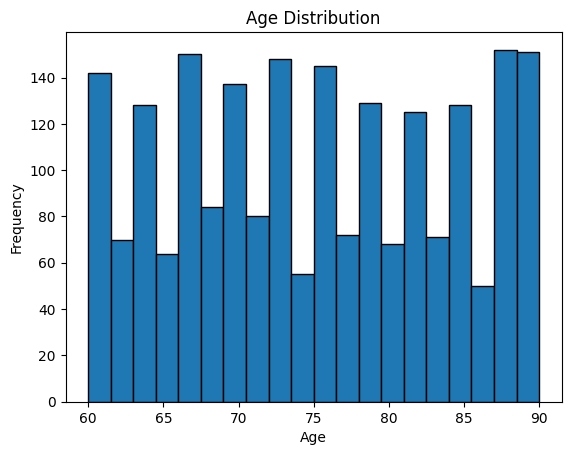

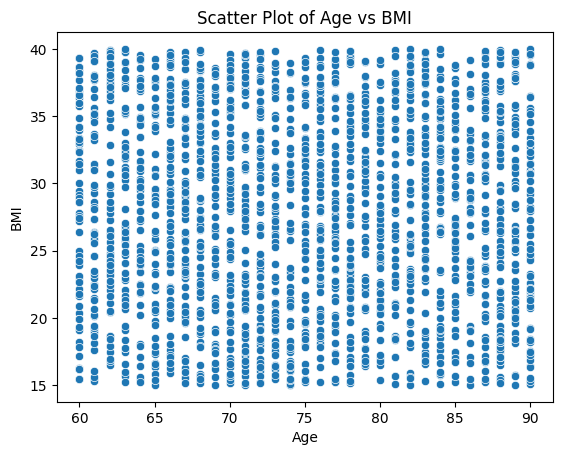

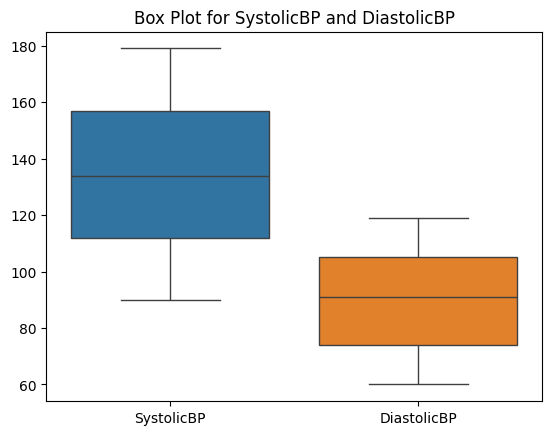

In [13]:
# Histogram for Age
df['Age'].plot(kind='hist', bins=20, edgecolor='black', title='Age Distribution')
plt.xlabel('Age')
plt.show()

# Scatter plot of Age vs BMI
sns.scatterplot(data=df, x='Age', y='BMI')
plt.title('Scatter Plot of Age vs BMI')
plt.show()

# Box Plot for SystolicBP and DiastolicBP
sns.boxplot(data=df[['SystolicBP', 'DiastolicBP']])
plt.title('Box Plot for SystolicBP and DiastolicBP')
plt.show()

In [ ]:
df.drop('DoctorInCharge', axis=1, inplace=True)
df.drop('PatientID', axis=1, inplace=True)

drop the id column its useless

In [ ]:
def find_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers


numerical_features = ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity',
                      'DietQuality', 'SleepQuality', 'SystolicBP', 'DiastolicBP',
                      'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
                      'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment',
                      'ADL']

#
for feature in numerical_features:
    outliers = find_outliers_iqr(df[feature])
    print(f"Outliers in '{feature}':")
    print(outliers)
    print("-" * 20)

Outliers in 'Age':
Series([], Name: Age, dtype: int64)
--------------------
Outliers in 'BMI':
Series([], Name: BMI, dtype: float64)
--------------------
Outliers in 'AlcoholConsumption':
Series([], Name: AlcoholConsumption, dtype: float64)
--------------------
Outliers in 'PhysicalActivity':
Series([], Name: PhysicalActivity, dtype: float64)
--------------------
Outliers in 'DietQuality':
Series([], Name: DietQuality, dtype: float64)
--------------------
Outliers in 'SleepQuality':
Series([], Name: SleepQuality, dtype: float64)
--------------------
Outliers in 'SystolicBP':
Series([], Name: SystolicBP, dtype: int64)
--------------------
Outliers in 'DiastolicBP':
Series([], Name: DiastolicBP, dtype: int64)
--------------------
Outliers in 'CholesterolTotal':
Series([], Name: CholesterolTotal, dtype: float64)
--------------------
Outliers in 'CholesterolLDL':
Series([], Name: CholesterolLDL, dtype: float64)
--------------------
Outliers in 'CholesterolHDL':
Series([], Name: Cholesterol

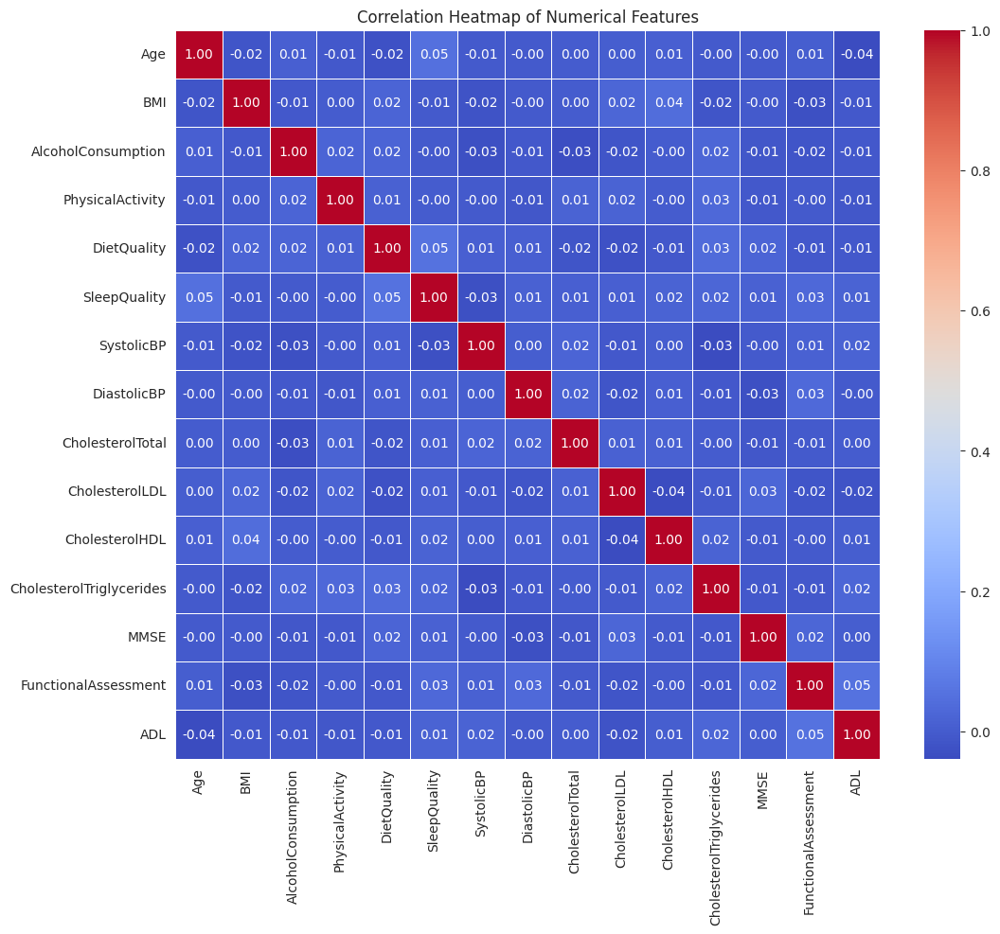

In [ ]:

numerical_features = ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity',
                      'DietQuality', 'SleepQuality', 'SystolicBP', 'DiastolicBP',
                      'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
                      'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment',
                      'ADL']

# Calculate correlation matrix
correlation_matrix = df[numerical_features].corr()

# Create heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

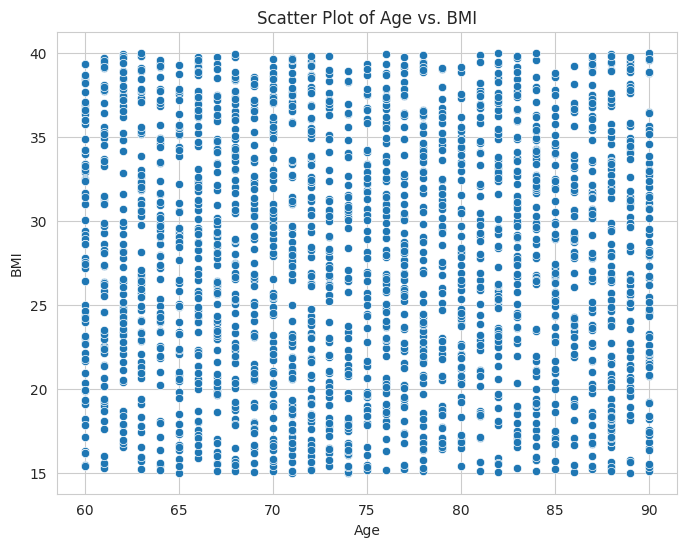

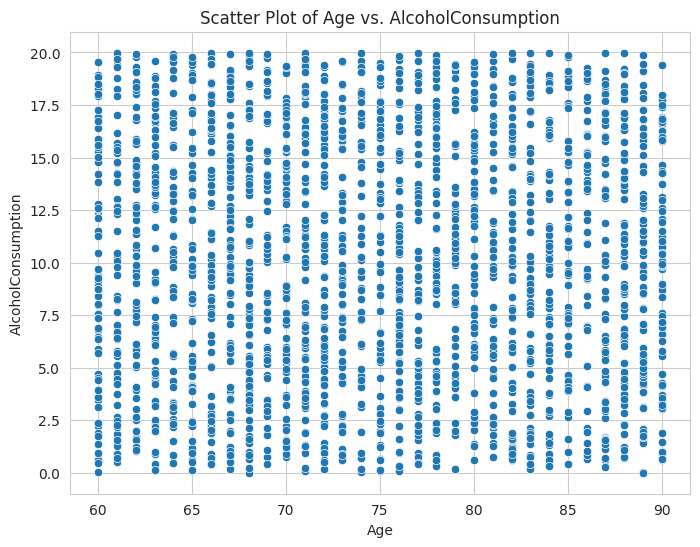

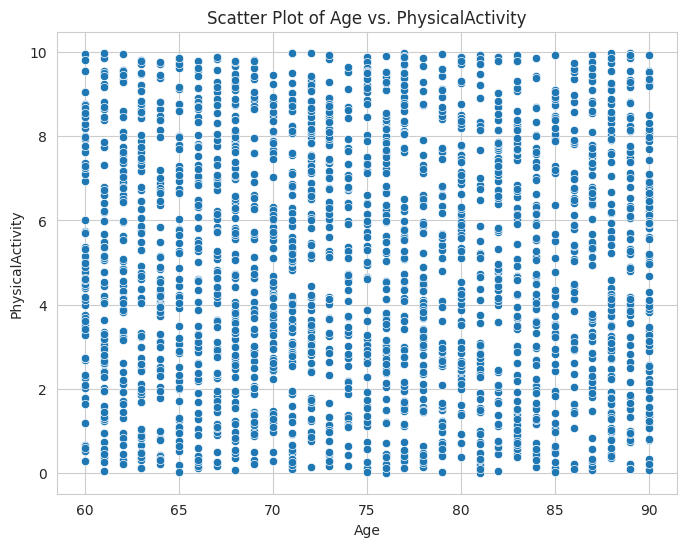

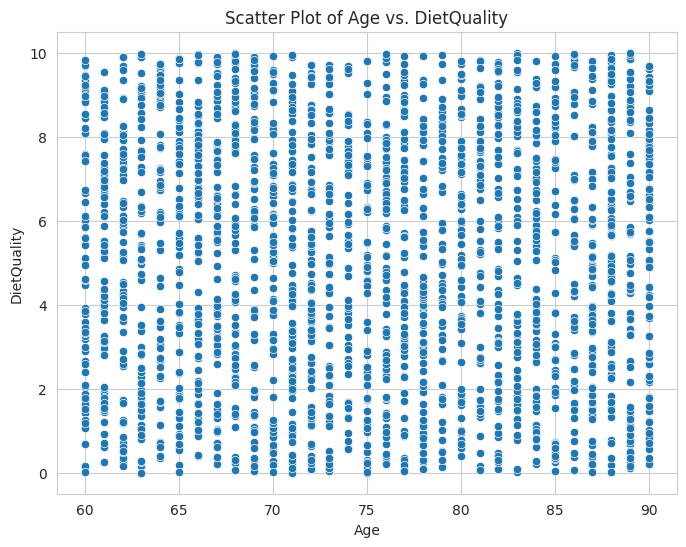

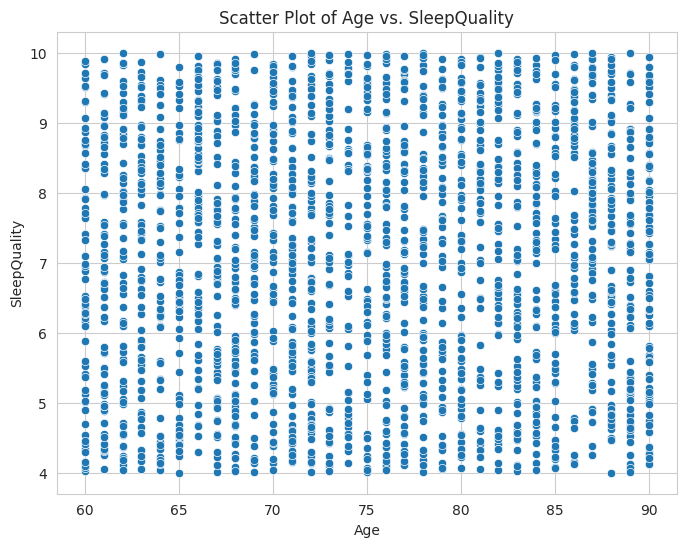

...

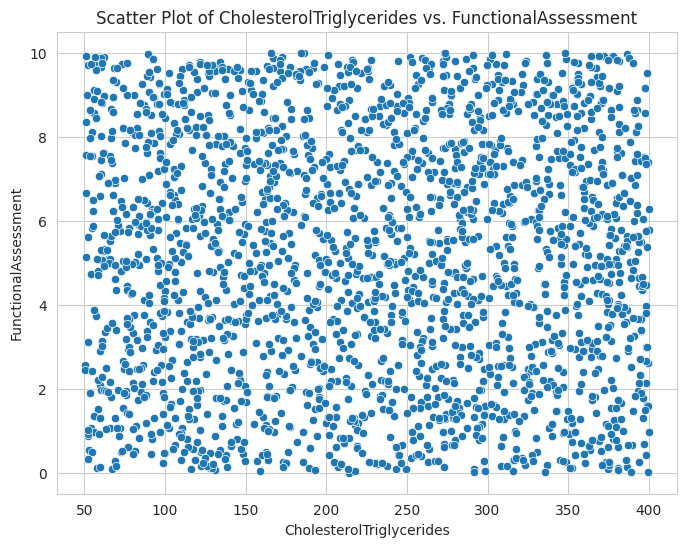

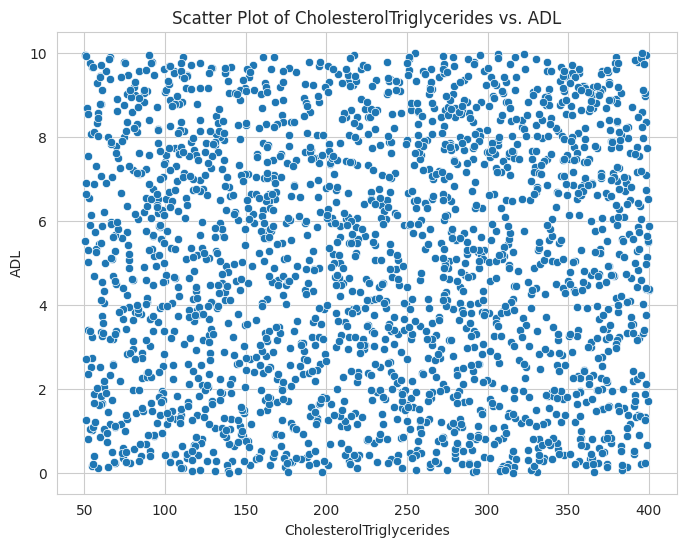

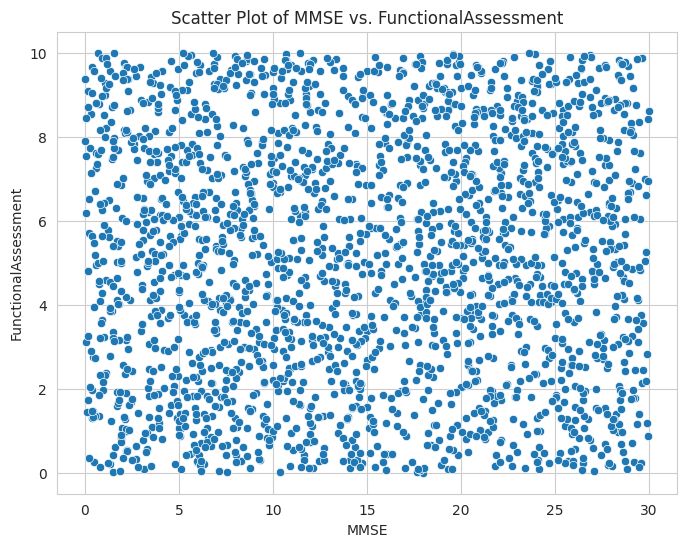

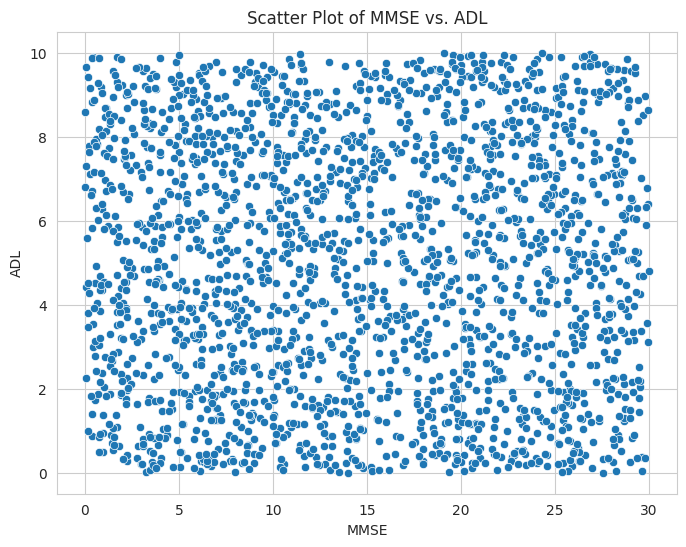

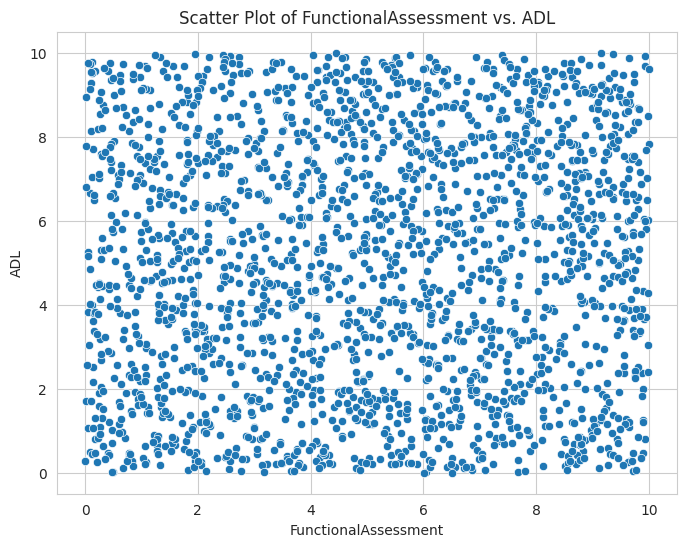

In [ ]:

numerical_features = ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity',
                      'DietQuality', 'SleepQuality', 'SystolicBP', 'DiastolicBP',
                      'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
                      'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment',
                      'ADL']


for i in range(len(numerical_features)):
    for j in range(i + 1, len(numerical_features)):
        feature1 = numerical_features[i]
        feature2 = numerical_features[j]
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[feature1], y=df[feature2])
        plt.title(f'Scatter Plot of {feature1} vs. {feature2}')
        plt.xlabel(feature1)
        plt.ylabel(feature2)
        plt.show()

In [ ]:
file_path = '/content/drive/MyDrive/Colab Notebooks/final/Alzheimer_cleaned_dataset.csv'
df.to_csv(file_path, index=False)

In [ ]:

df_loaded = pd.read_csv(file_path)

MOdel from Scratch

In [ ]:


# Define features (X) and target variable (y)
X = df.drop(columns=["Diagnosis"])
y = df["Diagnosis"]

# Split the dataset into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



MOdel Scratch initializing and trianing

In [ ]:
# Initialize model parameters
n_samples, n_features = X_train_scaled.shape
weights = np.zeros(n_features)
bias = 0
learning_rate = 0.01
epochs = 1000

# Sigmoid function
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Training using gradient descent
for epoch in range(epochs):
    linear_model = np.dot(X_train_scaled, weights) + bias
    y_pred = sigmoid(linear_model)

    # Compute gradients
    error = y_pred - y_train
    dw = (1 / n_samples) * np.dot(X_train_scaled.T, error)
    db = (1 / n_samples) * np.sum(error)

    # Update weights
    weights -= learning_rate * dw
    bias -= learning_rate * db

Prediction and Evualuation

In [ ]:
# Make predictions

y_train_pred = sigmoid(np.dot(X_train_scaled, weights) + bias) >= 0.5
y_test_pred = sigmoid(np.dot(X_test_scaled, weights) + bias) >= 0.5

# Evaluate model
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

# Print the accuracies
print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

Train Accuracy: 0.8528
Test Accuracy: 0.8302


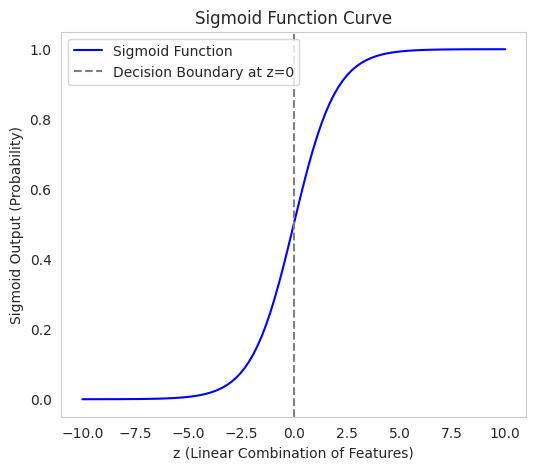

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


z = np.linspace(-10, 10, 100)
sigmoid_values = 1 / (1 + np.exp(-z))

# Plot the sigmoid function
plt.figure(figsize=(6, 5))
plt.plot(z, sigmoid_values, label="Sigmoid Function", color='blue')
plt.axvline(0, color='gray', linestyle='--', label="Decision Boundary at z=0")
plt.xlabel("z (Linear Combination of Features)")
plt.ylabel("Sigmoid Output (Probability)")
plt.title("Sigmoid Function Curve")
plt.legend()
plt.grid()
plt.show()

Build a Primary Model

In [ ]:
# Define features (X) and target (y)
X = df.drop(columns=["Diagnosis"])  # Features
y = df["Diagnosis"]

# Split into train (80%) and test (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Data preprocessing complete!")

Data preprocessing complete!


In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Initialize models
log_reg = LogisticRegression()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train models
log_reg.fit(X_train_scaled, y_train)
rf_clf.fit(X_train, y_train)

print("Models trained successfully!")


Models trained successfully!


In [ ]:
# Make predictions
y_pred_log_reg = log_reg.predict(X_test_scaled)
y_pred_rf = rf_clf.predict(X_test)

# Calculate accuracy
accuracy_log_reg = accuracy_score(y_test, y_pred_log_reg)
accuracy_rf = accuracy_score(y_test, y_pred_rf)

print(f"Logistic Regression Accuracy: {accuracy_log_reg:.4f}")
print(f"Random Forest Accuracy: {accuracy_rf:.4f}")



Logistic Regression Accuracy: 0.8302
Random Forest Accuracy: 0.9256


In [ ]:

# Report for Classification
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_log_reg,zero_division=0))

print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf,zero_division=0))


Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.89      0.87       277
           1       0.78      0.71      0.74       153

    accuracy                           0.83       430
   macro avg       0.81      0.80      0.81       430
weighted avg       0.82      0.83      0.82       430


Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.98      0.95       277
           1       0.96      0.83      0.89       153

    accuracy                           0.93       430
   macro avg       0.94      0.91      0.92       430
weighted avg       0.93      0.93      0.93       430



Based on the evaluation metrics, Random Forest Classification outperformed Logistic Regression on your dataset.

Justification:
Higher Accuracy:

Random Forest achieved an accuracy of 93%, meaning it correctly classified 93% of the samples compared to 83% for Logistic Regression.

Improved F1-scores:

For the positive class (class 1), Logistic Regression had a recall of 0.71 and an f1-score of 0.74, whereas Random Forest improved these metrics with a recall of 0.83 and an f1-score of 0.89.

This indicates that Random Forest is better at correctly identifying malaria cases while balancing precision and recall.
Handling of Nonlinear Relationships:

Random Forest effectively captures nonlinear patterns and complex feature interactions inherent in the dataset.

 In contrast, Logistic Regression is limited by its assumption of a linear relationship between features and the target variable, leading to lower performance when such relationships exist.

Robustness to Data Variability:

The ensemble nature of Random Forest helps reduce variance and makes the model more robust to noise and outliers.

 Logistic Regression, being a single model, may struggle with the variability and overlapping distributions in the data, which contributes to its lower performance (macro f1-score around 0.81).

In [ ]:
if accuracy_rf > accuracy_log_reg:
    best_model = "Random Forest"
else:
    best_model = "Logistic Regression"

print(f"\nBest performing model: {best_model}")



Best performing model: Random Forest


Logistic Regression as a Baseline Model:

Simplicity and Interpretability: Logistic Regression offers a straightforward, interpretable model that provides clear insight into the relationship between features and the binary outcome.

 This makes it an excellent baseline for understanding the dataset.


Efficiency: Its computational efficiency allows for quick training and evaluation, which is ideal for initial experimentation and model comparison.

Benchmarking: Establishing performance with Logistic Regression helps set a benchmark against which more complex models can be measured.

Random Forest as an Advanced Model:

Handling Nonlinear Relationships: Unlike Logistic Regression, Random Forest can capture nonlinear interactions and complex feature relationships, which are often present in real-world data.

Robustness and Accuracy:

 The ensemble nature of Random Forest makes it robust to outliers and noise. In our evaluation, Random Forest achieved a higher overall accuracy (93% vs. 83% for Logistic Regression) and improved F1-scores, particularly for the positive class.

Feature Importance:

 Random Forest provides insights into feature importance, which can be useful for further refining the model and understanding which features contribute most significantly to the prediction.

Hyper Optimization

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
import numpy as np


log_reg_param_grid = {
    'penalty': ['l1', 'l2'],
    'C': np.logspace(-4, 4, 20),
    'solver': ['liblinear', 'saga']
}


log_reg_random = RandomizedSearchCV(
    LogisticRegression(), log_reg_param_grid, n_iter=10, cv=5, scoring='accuracy', random_state=42
)


log_reg_random.fit(X_train_selected_scaled, y_train)


print("Best Hyperparameters for Logistic Regression:", log_reg_random.best_params_)

Best Hyperparameters for Logistic Regression: {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.08858667904100823}


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
import numpy as np


rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}


rf_classifier = RandomForestClassifier(random_state=42)

# Create RandomizedSearchCV object
rf_random = RandomizedSearchCV(
    estimator=rf_classifier,
    param_distributions=rf_param_grid,
    n_iter=10,
    cv=5,
    scoring='accuracy',
    random_state=42,
    n_jobs=-1
)


rf_random.fit(X_train_selected_scaled, y_train)

# find the best hyperparamets
print("Best Hyperparameters for Random Forest:", rf_random.best_params_)

Best Hyperparameters for Random Forest: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 30, 'criterion': 'entropy'}


fter performing hyperparameter tuning using RandomizedSearchCV on the selected and scaled training data, the best hyperparameters for the two models are:

Logistic Regression:

Solver: liblinear

Penalty: l1

Regularization Strength (C): 0.08858667904100823

Random Forest Classifier:


Number of Trees (n_estimators): 200

Minimum Samples to Split a Node (min_samples_split): 10

Minimum Samples per Leaf (min_samples_leaf): 2

Maximum Depth of the Tree (max_depth): 30

Criterion: entropy

These hyperparameter settings provided the optimal performance based on accuracy, with Logistic Regression offering an interpretable baseline and Random Forest effectively capturing nonlinear relationships for improved predictive performance.

Feature Selection

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif


kbest = SelectKBest(score_func=f_classif, k=9)


kbest.fit(X_train_scaled, y_train)


kbest_features = X_train.columns[kbest.get_support()].tolist()


print("Top 9 Features from SelectKBest:", kbest_features)


X_train_selected = X_train[kbest_features]
X_test_selected = X_test[kbest_features]


scaler = StandardScaler()
X_train_selected_scaled = scaler.fit_transform(X_train_selected)
X_test_selected_scaled = scaler.transform(X_test_selected)



Top 9 Features from SelectKBest: ['EducationLevel', 'SleepQuality', 'SystolicBP', 'CholesterolHDL', 'MMSE', 'FunctionalAssessment', 'MemoryComplaints', 'BehavioralProblems', 'ADL']


Feature Selection Process:

Method:

We used scikit-learn’s SelectKBest with the f_classif scoring function to rank features based on their statistical association with the target.

Justification for Chosen Features:

Statistical Significance:

The f_classif test ensured that only features with the strongest association to the target (Alzheimer’s indicators) were selected.


Domain Relevance:

The selected features (e.g., MMSE, blood pressure, memory complaints, etc.) align with known risk factors and symptoms for Alzheimer’s.

Model Efficiency and Interpretability: Reducing the feature set to 9 minimizes overfitting risk and simplifies model interpretation without compromising predictive performance.


FINAL MODEL

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report


best_log_reg_params = log_reg_random.best_params_
best_rf_params = rf_random.best_params_

selected_features = kbest_features


X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]


scaler = StandardScaler()
X_train_selected_scaled = scaler.fit_transform(X_train_selected)
X_test_selected_scaled = scaler.transform(X_test_selected)


final_log_reg = LogisticRegression(**best_log_reg_params)
final_rf = RandomForestClassifier(**best_rf_params, random_state=42)


final_log_reg.fit(X_train_selected_scaled, y_train)
final_rf.fit(X_train_selected_scaled, y_train)


y_pred_log_reg = final_log_reg.predict(X_test_selected_scaled)
y_pred_rf = final_rf.predict(X_test_selected_scaled)


print("Logistic Regression:")
print("Accuracy:", accuracy_score(y_test, y_pred_log_reg))
print(classification_report(y_test, y_pred_log_reg, zero_division=0))

print("\nRandom Forest:")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf, zero_division=0))



Logistic Regression:
Accuracy: 0.8348837209302326
              precision    recall  f1-score   support

           0       0.86      0.90      0.87       277
           1       0.79      0.73      0.76       153

    accuracy                           0.83       430
   macro avg       0.82      0.81      0.82       430
weighted avg       0.83      0.83      0.83       430


Random Forest:
Accuracy: 0.9558139534883721
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       277
           1       0.97      0.91      0.94       153

    accuracy                           0.96       430
   macro avg       0.96      0.95      0.95       430
weighted avg       0.96      0.96      0.96       430



After feature selection and hyperparameter tuning, both Logistic Regression and Random Forest were trained on the optimized feature set.

 Their performance was evaluated using accuracy, precision, recall, and F1-score.

Logistic Regression:
Accuracy: 83.49%

Precision: 86% (Class 0), 79% (Class 1)

Recall: 90% (Class 0), 73% (Class 1)

F1-score: 87% (Class 0), 76% (Class 1)

 Findings: Logistic Regression performed reasonably well, especially for Class 0, but struggled with lower recall for Class 1, indicating potential difficulty in identifying positive cases.

Random Forest:

Accuracy: 95.58%

Precision: 95% (Class 0), 97% (Class 1)

Recall: 98% (Class 0), 91% (Class 1)

F1-score: 97% (Class 0), 94% (Class 1)

Findings:
 Random Forest significantly outperformed Logistic Regression, achieving higher overall accuracy and F1-scores.

  It demonstrated better recall for Class 1, making it more reliable for detecting positive cases.

Conclusion:
Random Forest is the superior model for this task, providing higher accuracy and better balance between precision and recall.

It effectively captures complex feature interactions, making it a more robust choice for classification.

# **Future insights**
Insights and Future Directions
Insights

The overall findings underscore the advantage of ensemble methods over linear models in complex classification tasks; Random Forest consistently outperformed Logistic Regression.


Incorporating techniques like cross-validation and feature selection not only enhances model performance but also ensures that the model is more robust and interpretable.


Hyperparameter optimization plays a critical role; even relatively small adjustments (e.g., setting a maximum depth or tuning the regularization strength) can lead to notable improvements in predictive accuracy.


Future Direction:

Exploring Alternative Ensemble Methods:

 While Random Forest showed excellent performance, further exploration of methods such as Gradient Boosting or XGBoost may yield additional gains.
Additional Feature Engineering:

 Beyond selecting the top features, future work could include investigating interaction terms or non-linear transformations to capture more complex patterns.


Validation on External Data:

 To further confirm generalizability, testing the optimized model on an entirely independent dataset or through a prospective study would be beneficial.

Automated Model Pipelines:

 Integrating automated hyperparameter tuning and feature selection within a pipeline (e.g., using nested cross-validation) could streamline model development for similar future tasks.

# **Primary Model**
 The primary model will be built using a Random Forest classifier with the following key elements:

Hyperparameters:
n_estimators: 200
max_depth: 30
min_samples_split: 10
min_samples_leaf: 2
criterion: 'entropy'
Feature Set:
The model will use the top 9 features identified via SelectKBest with f_classif—namely, 'EducationLevel', 'SleepQuality', 'SystolicBP', 'CholesterolHDL', 'MMSE', 'FunctionalAssessment', 'MemoryComplaints', 'BehavioralProblems', and 'ADL'.



This final configuration not only maximizes predictive performance (with an accuracy nearing 96%) but also offers improved interpretability and a controlled model complexity.





 Future iterations could be extending the model with additional ensemble techniques or exploring more sophisticated feature engineering methods.